In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import pandas as pd
import json

example_r1 = 'regions/20081122_region1.nc'
example_r2 = 'regions/20081122_region2.nc'

example_r1_ds = xr.open_dataset(example_r1)
example_r2_ds = xr.open_dataset(example_r2)

matplotlib.rcParams.update({'font.size': 20})

Matplotlib created a temporary cache directory at /tmp/matplotlib-d6u1uu8q because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
from keras.models import load_model

model = 'model-3.keras'
model = load_model(model) 

2024-05-31 13:56:04.890887: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-05-31 13:56:04.948473: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-31 13:56:05.754932: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2024-05-31 13:56:09.265156: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:998] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://g

In [3]:
import numpy as np
import pandas as pd

def prepare_ds(dataset, mydate):
    
    date = pd.to_datetime(mydate, format = '%Y%m%d')
    date = date.dayofyear
    
    selected_data = {
        'thetao_oras': dataset.thetao_oras.isel(time=0, depth=0),
        'so_oras': dataset.so_oras.isel(time=0, depth=0),
        'uo_oras': dataset.uo_oras.isel(time=0, depth=0),
        'vo_oras': dataset.vo_oras.isel(time=0, depth=0),
        'zos_oras': dataset.zos_oras.isel(time=0, depth=0),  # Assuming the dimensions for zos_oras include depth, adjust if necessary
        'mlotst_oras': dataset.mlotst_oras.isel(time=0, depth=0),  # Assuming the dimensions for mlotst_oras include depth, adjust if necessary
    }
    
    lon_mod, lat_mod = np.meshgrid(dataset.longitude, dataset.latitude)
    
    lats = lat_mod.ravel()
    lons = lon_mod.ravel()
    
    sst = selected_data['thetao_oras'].values.ravel()
    sss = selected_data['so_oras'].values.ravel()
    uo = selected_data['uo_oras'].values.ravel()
    vo = selected_data['vo_oras'].values.ravel()
    ssh = selected_data['zos_oras'].values.ravel()
    mld = selected_data['mlotst_oras'].values.ravel()
    
    # Stack the arrays to easily identify NaN positions
    stacked_data = np.stack([sst, sss, uo, vo, ssh, mld])
    
    # Create a mask where any of the variables is NaN
    nan_mask = np.any(np.isnan(stacked_data), axis=0)
    
    # Apply the mask to filter out NaN points
    lats = lats[~nan_mask]
    lons = lons[~nan_mask]
    sst = sst[~nan_mask]
    sss = sss[~nan_mask]
    uo = uo[~nan_mask]
    vo = vo[~nan_mask]
    ssh = ssh[~nan_mask]
    mld = mld[~nan_mask]
    
    heights = dataset.depth[0:46]
    
    data = np.zeros((np.size(sst), 46, 10))
    
    # Fill in the values using broadcasting
    data[:, :, 0] = lats[:, np.newaxis]
    data[:, :, 1] = lons[:, np.newaxis]
    data[:, :, 3] = sss[:, np.newaxis]
    data[:, :, 4] = sst[:, np.newaxis]
    data[:, :, 5] = ssh[:, np.newaxis]
    data[:, :, 6] = mld[:, np.newaxis]
    data[:, :, 7] = uo[:, np.newaxis]
    data[:, :, 8] = vo[:, np.newaxis]
    data[:, :, 9] = date  # Assuming 'date' is a scalar
    data[:, :, 2] = heights  # Assuming 'heights' is a 1D array of length 46

    # Read the min_max_values from the JSON file
    with open('min_max_values.json', 'r') as f:
        min_max_values = json.load(f)
    
    # Loop over each variable and scale the corresponding data using the min_max_values
    for var_name, var_scaling in min_max_values['min_values'].items():
        var_min = var_scaling
        var_max = min_max_values['max_values'][var_name]
        
        # Find the index of the variable in your data array
        var_index = None
        if var_name == 'LATITUDE':
            var_index = 0
        elif var_name == 'LONGITUDE':
            var_index = 1
        elif var_name == 'SSS':
            var_index = 3
        elif var_name == 'SST':
            var_index = 4
        elif var_name == 'SSH':
            var_index = 5
        elif var_name == 'MLD':
            var_index = 6
        elif var_name == 'UO':
            var_index = 7
        elif var_name == 'VO':
            var_index = 8
        elif var_name == 'DATE':
            var_index = 9
        elif var_name == 'HEIGHT':
            var_index = 2
        
        if var_index is not None:
            # Scale the data for the variable using the min_max_values
            data[:, :, var_index] = (data[:, :, var_index] - var_min) / (var_max - var_min)
            
    return data, lats, lons


s, lat, lon = prepare_ds(example_r1_ds, '20081022')

d = example_r1_ds.depth.values
d = d[d<1000]

In [4]:
import glob
import os

# Step 1: Identify and loop over all relevant files
file_pattern = "regions/*_region1.nc"
files = glob.glob(file_pattern)

matrices_model_5_asal = []
matrices_pred_5_asal = []

matrices_model_50_asal = []
matrices_pred_50_asal = []

matrices_model_500_asal = []
matrices_pred_500_asal = []

matrices_model_5_ctemp = []
matrices_pred_5_ctemp = []

matrices_model_50_ctemp = []
matrices_pred_50_ctemp = []

matrices_model_500_ctemp = []
matrices_pred_500_ctemp = []

lat_bins = np.linspace(25-0.125, 44+0.125, 77+1)
lon_bins = np.linspace(-79-0.125, -41+0.125, 153+1)

with open('min_max_values.json', 'r') as f:
    min_max_values = json.load(f)

for file in files:
    file_name = os.path.basename(file)
    date = file_name.split('_')[0]  # Assuming the date is at the beginning and separated by underscores
    ds = xr.open_dataset(file)
    s, lats, lons = prepare_ds(ds, date)

    # 5m salinity
    p = model.predict(s)
    asal = p[:,:,0] * (min_max_values['max_values']['ASAL'] - min_max_values['min_values']['ASAL']) + min_max_values['min_values']['ASAL']
    ctemp = p[:,:,1] * (min_max_values['max_values']['CTEMP'] - min_max_values['min_values']['CTEMP']) + min_max_values['min_values']['CTEMP']
    
    p5, _, _ = np.histogram2d(lats, lons, bins=[
                                lat_bins, lon_bins], weights=asal[:,4])
    
    p5[p5==0] = np.nan
    
    matrices_pred_5_asal.append(p5)
    matrices_model_5_asal.append(ds.so_oras[0][4])

    # 50m salinity
    p50, _, _ = np.histogram2d(lats, lons, bins=[
                                lat_bins, lon_bins], weights=asal[:,17])
    p50[p50==0] = np.nan

    matrices_pred_50_asal.append(p50)
    matrices_model_50_asal.append(ds.so_oras[0][17])

    # 50m salinity
    p500, _, _ = np.histogram2d(lats, lons, bins=[
                                lat_bins, lon_bins], weights=asal[:,39])
    p500[p500==0] = np.nan

    matrices_pred_500_asal.append(p500)
    matrices_model_500_asal.append(ds.so_oras[0][39])

    # TEMPERATURE
    # 5m salinity
    p5, _, _ = np.histogram2d(lats, lons, bins=[
                                lat_bins, lon_bins], weights=ctemp[:,4])
    p5[p5==0] = np.nan

    matrices_pred_5_ctemp.append(p5)
    matrices_model_5_ctemp.append(ds.thetao_oras[0][4])

    # 50m salinity
    p50, _, _ = np.histogram2d(lats, lons, bins=[
                                lat_bins, lon_bins], weights=ctemp[:,17])
    p50[p50==0] = np.nan

    matrices_pred_50_ctemp.append(p50)
    matrices_model_50_ctemp.append(ds.thetao_oras[0][17])

    # 50m salinity
    p500, _, _ = np.histogram2d(lats, lons, bins=[
                                lat_bins, lon_bins], weights=ctemp[:,39])
    p500[p500==0] = np.nan

    matrices_pred_500_ctemp.append(p500)
    matrices_model_500_ctemp.append(ds.thetao_oras[0][39])


I0000 00:00:1717163775.533132 1678774 service.cc:145] XLA service 0x56210b25ace0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1717163775.533244 1678774 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1717163775.533253 1678774 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
2024-05-31 13:56:15.609116: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-05-31 13:56:15.812762: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:465] Loaded cuDNN version 8906


  7/342 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step

I0000 00:00:1717163776.791821 1678774 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


342/342 ━━━━━━━━━━━━━━━━━━━━ 12s 29ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step
342/342 ━━━━━━━━━━━━━━━━━━━━ 8s 2

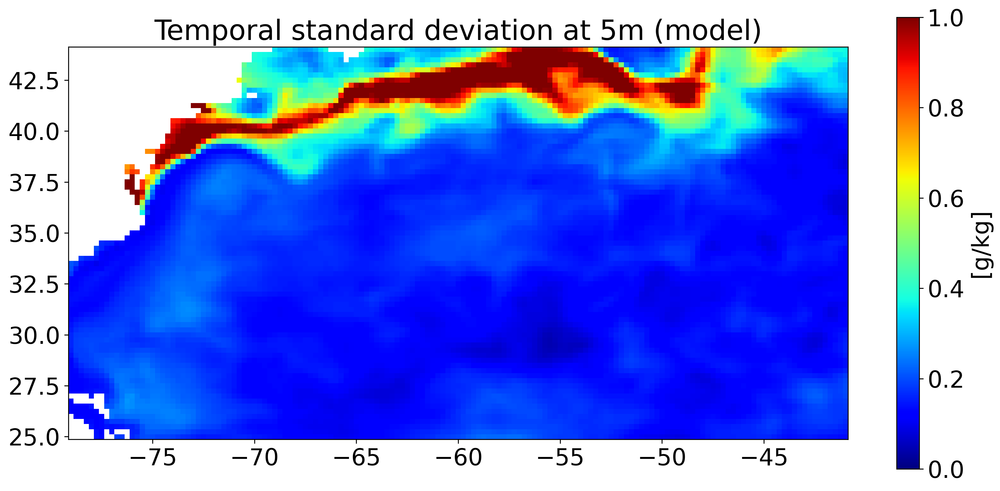

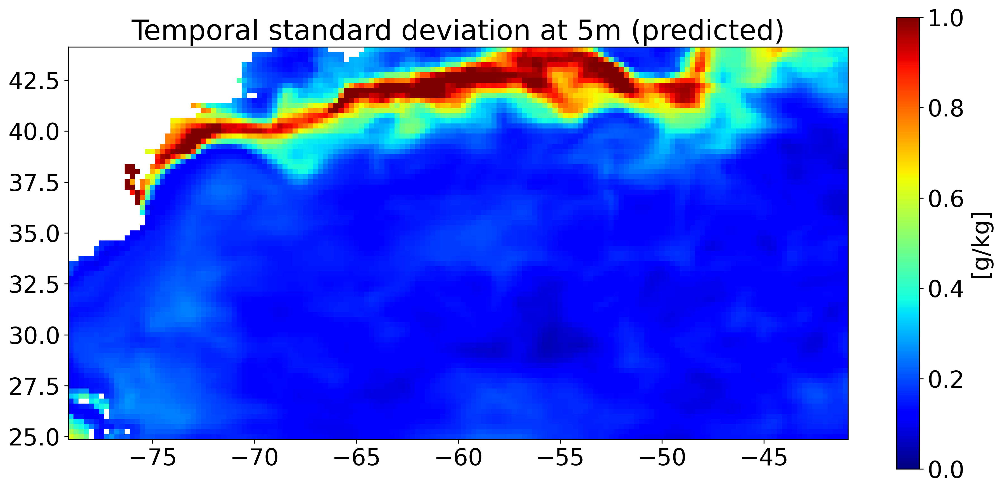

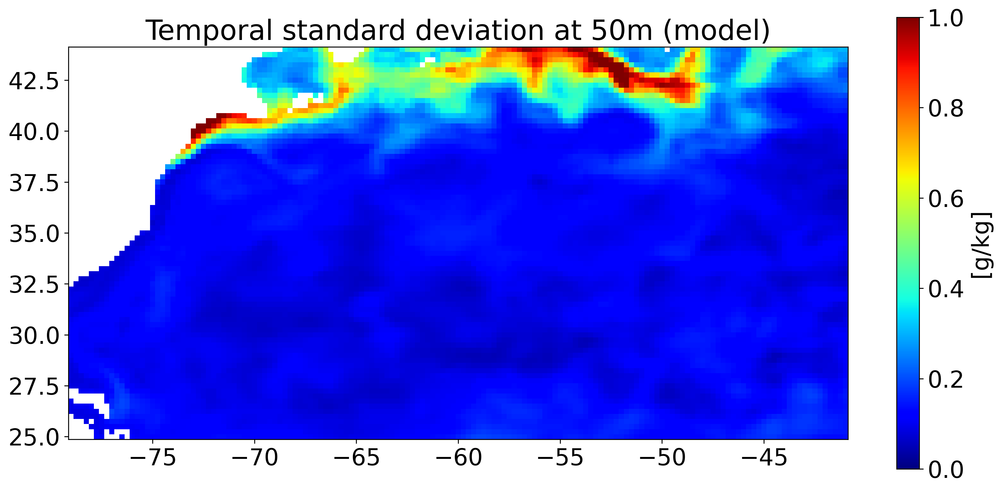

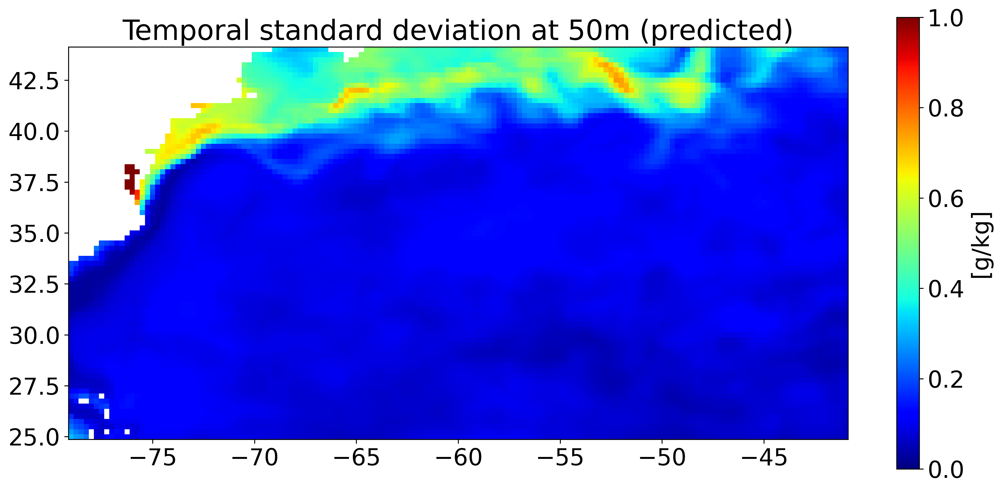

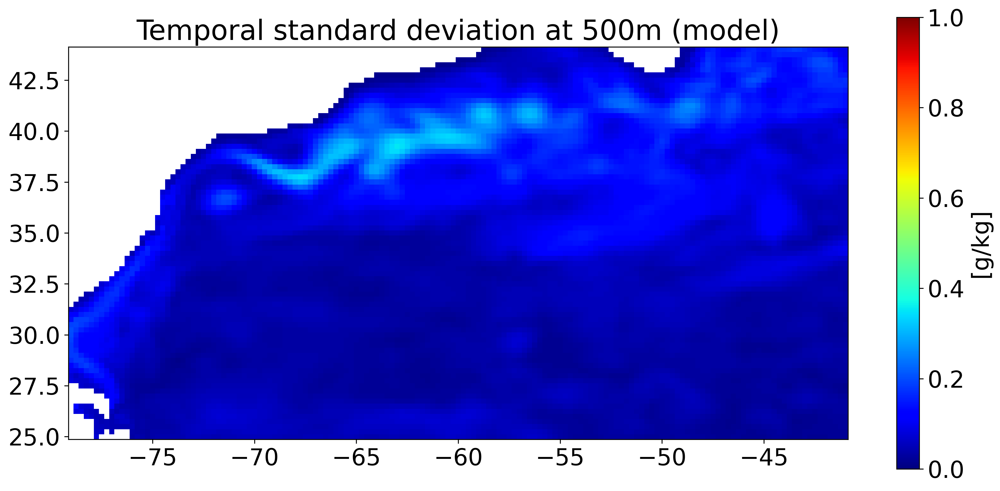

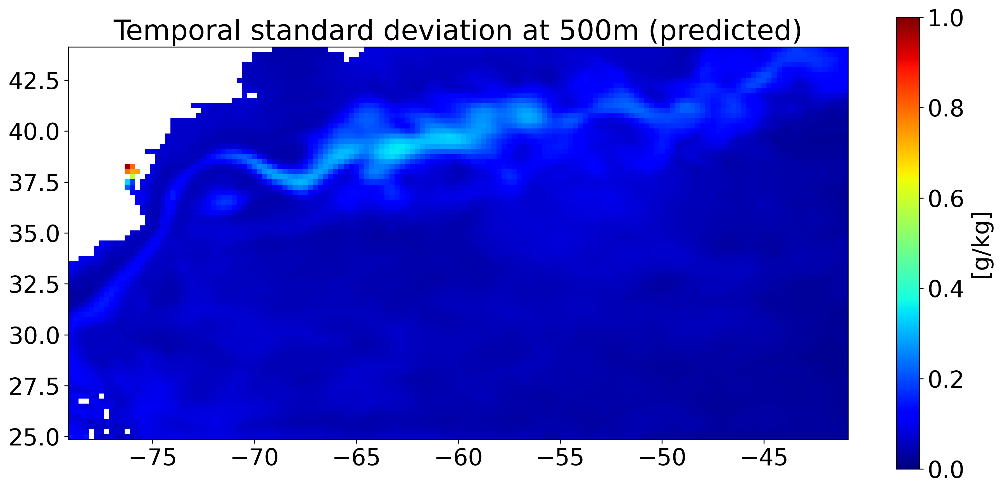

In [5]:
def compute_std_map(matrix1, matrix2):
    # Get the dimensions
    A, B, C = matrix1.shape
    
    # Initialize correlation map
    std_map1 = np.zeros((B, C))
    std_map2 = np.zeros((B, C))
    
    for i in range(B):
        for j in range(C):
            # Extract time series from both matrices
            ts1 = matrix1[:, i, j]
            ts2 = matrix2[:, i, j]
                        
            # Compute correlation coefficient
            std_map1[i, j] = np.std(ts1)
            std_map2[i, j] = np.std(ts2)
    return std_map1, std_map2
    
mm5 = np.stack(matrices_model_5_asal, axis=0)
mp5 = np.stack(matrices_pred_5_asal, axis=0)
std_5_pred, std_5_mod = compute_std_map(mp5, mm5)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 5m (model)')
plt.imshow(std_5_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax = 1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_S_5_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 5m (predicted)')
plt.imshow(std_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax = 1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_S_5_PRED.png")
plt.show()

# 50m
mm50 = np.stack(matrices_model_50_asal, axis=0)
mp50 = np.stack(matrices_pred_50_asal, axis=0)
std_50_pred, std_50_mod  = compute_std_map(mp50, mm50)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 50m (model)')
plt.imshow(std_50_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_S_50_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 50m (predicted)')
plt.imshow(std_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_S_50_PRED.png")
plt.show()

#500m
mm500 = np.stack(matrices_model_500_asal, axis=0)
mp500 = np.stack(matrices_pred_500_asal, axis=0)
std_500_pred, std_500_mod  = compute_std_map(mp500, mm500)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 500m (model)')
plt.imshow(std_500_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_S_500_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 500m (predicted)')
plt.imshow(std_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=1, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_S_500_PRED.png")
plt.show()

In [6]:
import scipy

def compute_mean_map(matrix1, matrix2):
    # Get the dimensions
    A, B, C = matrix1.shape
    
    # Initialize correlation map
    mean_map1 = np.zeros((B, C))
    mean_map2 = np.zeros((B, C))
    
    for i in range(B):
        for j in range(C):
            # Extract time series from both matrices
            ts1 = matrix1[:, i, j]
            ts2 = matrix2[:, i, j]
                        
            # Compute correlation coefficient
            mean_map1[i, j] = np.mean(ts1)
            mean_map2[i, j] = np.mean(ts2)
    return mean_map1, mean_map2

def mask_sig_trend(da_clim_cci,da_clim_ersst,da_var_cci,da_var_ersst,nt,q):
    nlat,nlon = da_clim_cci.shape
    mask_sig_mean=np.zeros([nlat,nlon])

    dof=2*nt-2
    t_critic=scipy.stats.t.ppf(q=q,df=dof)
    print(t_critic)
    # Compute pooled standard error of the difference in slopes
    se_diff = np.sqrt(da_var_cci**2 + da_var_ersst**2)
    t_stats=(da_clim_cci-da_clim_ersst)/se_diff
    print(mask_sig_mean.shape)

    mask_sig_mean[np.abs(t_stats) >= t_critic]=1
    print(mask_sig_mean.shape)
    return mask_sig_mean

(731, 77, 153)
(731, 77, 153)
731


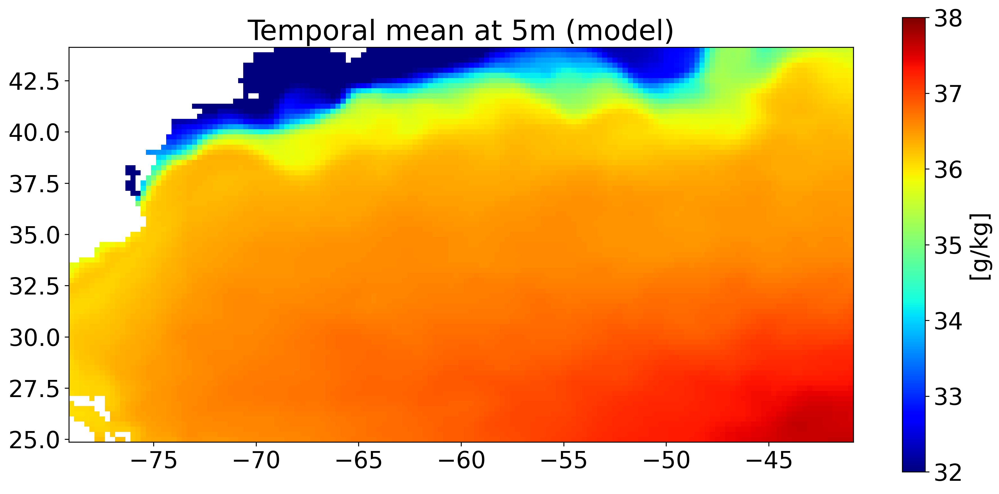

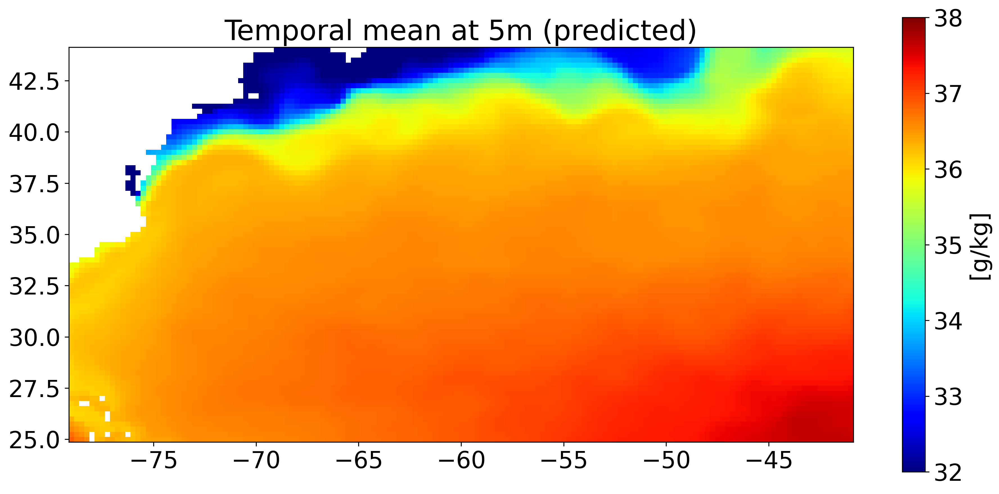

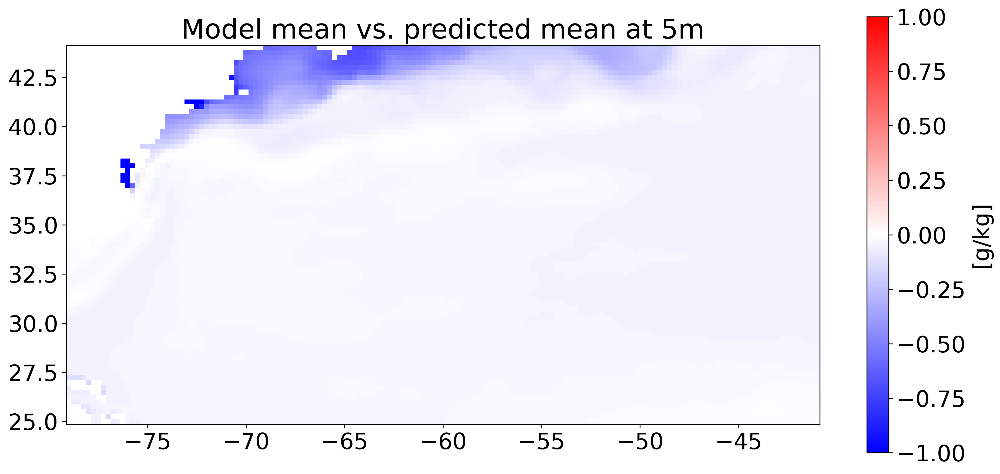

1.961590152792155
(77, 153)
(77, 153)


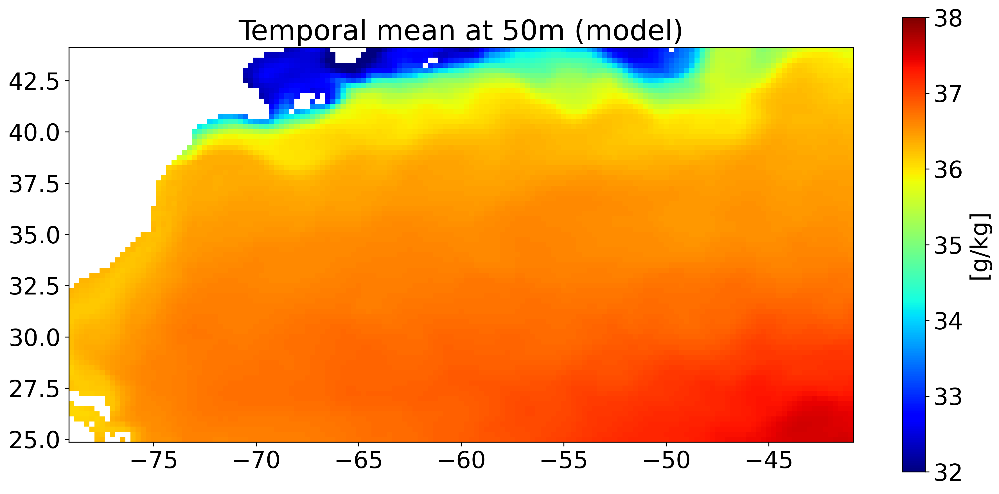

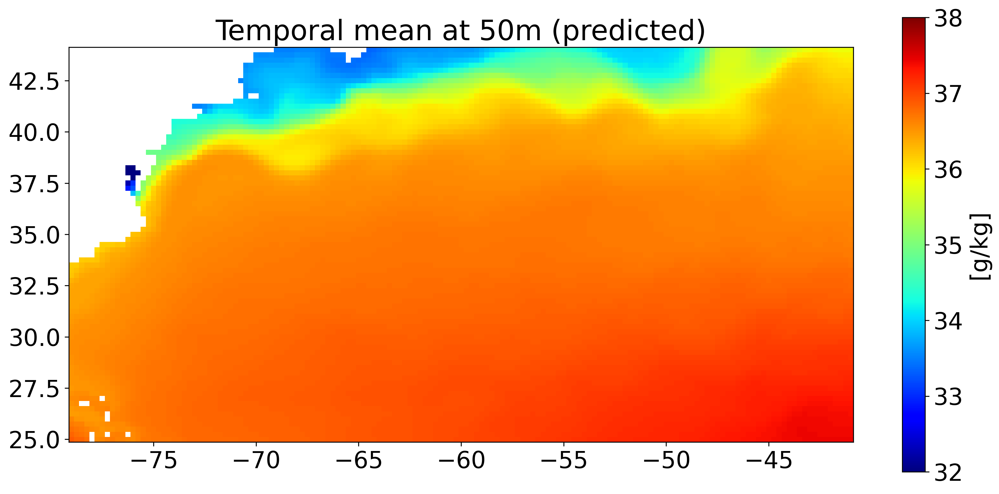

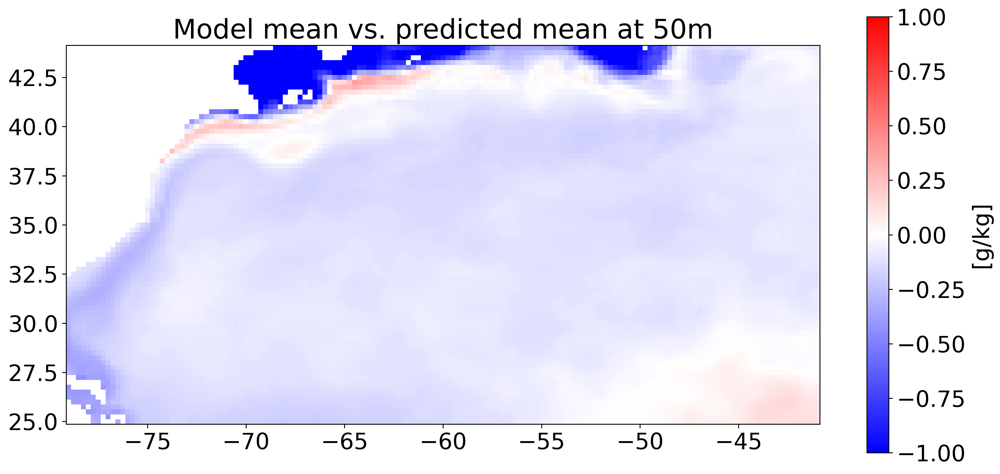

1.961590152792155
(77, 153)
(77, 153)


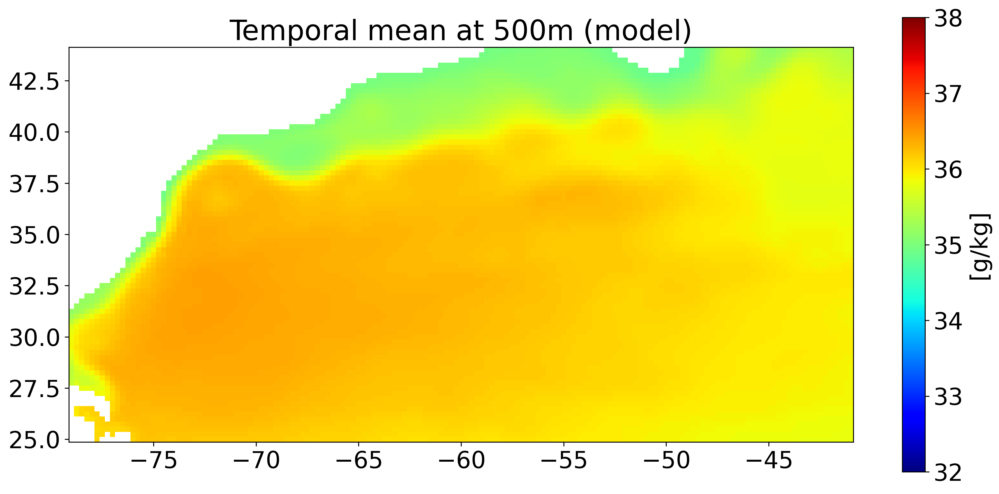

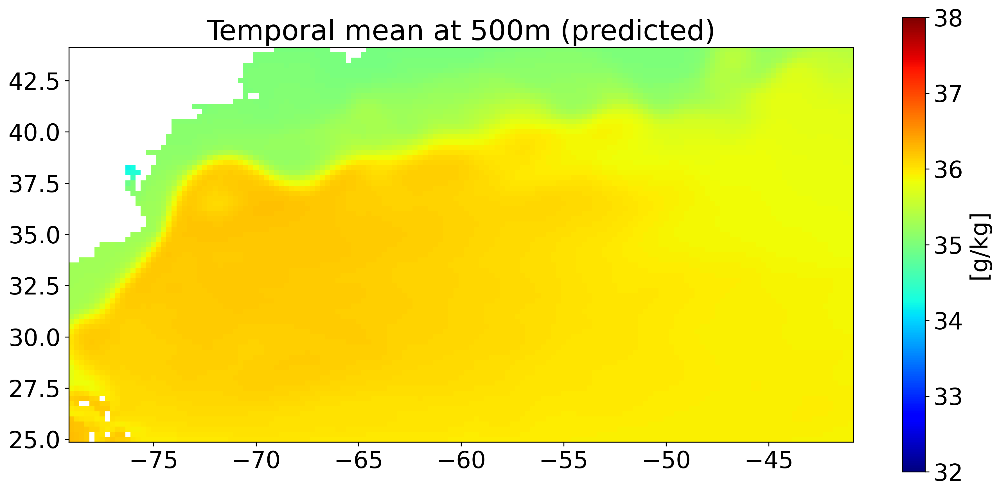

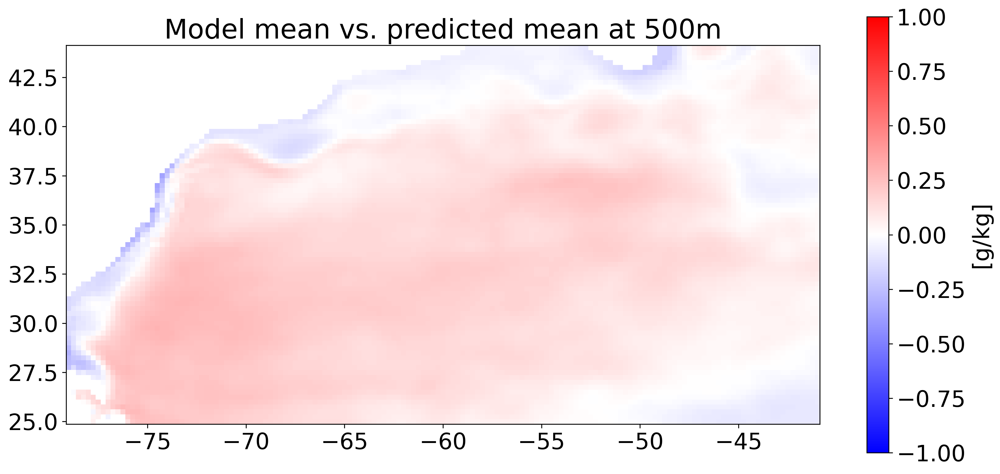

In [7]:
mm5 = np.stack(matrices_model_5_asal, axis=0)
mp5 = np.stack(matrices_pred_5_asal, axis=0)

print(np.shape(mm5))
print(np.shape(mp5))

nt, _, _ = mm5.shape
print(nt)
q=0.975

mean_5_pred, mean_5_mod = compute_mean_map(mp5, mm5)
#mask = mask_sig_trend(mean_5_mod,mean_5_pred,std_5_mod,std_5_pred,nt,q)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 5m (model)')
plt.imshow(mean_5_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_S_5_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 5m (predicted)')
plt.imshow(mean_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]') 
plt.savefig("MEAN_LSTM_512_S_5_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Model mean vs. predicted mean at 5m')
#x, y = np.meshgrid(example_r1_ds.longitude, example_r1_ds.latitude)  
#plt.contour(x, y, mask,colors='k',levels=1)
plt.imshow(mean_5_mod - mean_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  
plt.savefig("BIAS_LSTM_512_S_5_PRED.png")
plt.show()

# 50m
mm50 = np.stack(matrices_model_50_asal, axis=0)
mp50 = np.stack(matrices_pred_50_asal, axis=0)
mean_50_pred, mean_50_mod = compute_mean_map(mp50, mm50)
mask = mask_sig_trend(mean_50_mod,mean_50_pred,std_50_mod,std_50_pred,nt,q)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 50m (model)')
plt.imshow(mean_50_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_S_50_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 50m (predicted)')
plt.imshow(mean_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_S_50_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Model mean vs. predicted mean at 50m')
#plt.contour(x, y, mask,colors='k',levels=1)
plt.imshow(mean_50_mod - mean_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("BIAS_LSTM_512_S_50_PRED.png")
plt.show()

#500m
mm500 = np.stack(matrices_model_500_asal, axis=0)
mp500 = np.stack(matrices_pred_500_asal, axis=0)
mean_500_pred, mean_500_mod = compute_mean_map(mp500, mm500)
mask = mask_sig_trend(mean_500_mod,mean_500_pred,std_500_mod,std_500_pred,nt,q)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 500m (model)')
plt.imshow(mean_500_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_S_500_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 500m (predicted)')
plt.imshow(mean_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=32, vmax=38, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_S_500_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Model mean vs. predicted mean at 500m')
#plt.contour(x, y, mask,colors='k',levels=1)
plt.imshow(mean_500_mod - mean_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("BIAS_LSTM_512_S_500_PRED.png")
plt.show()

/opt/conda/envs/TensorFlow/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/envs/TensorFlow/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


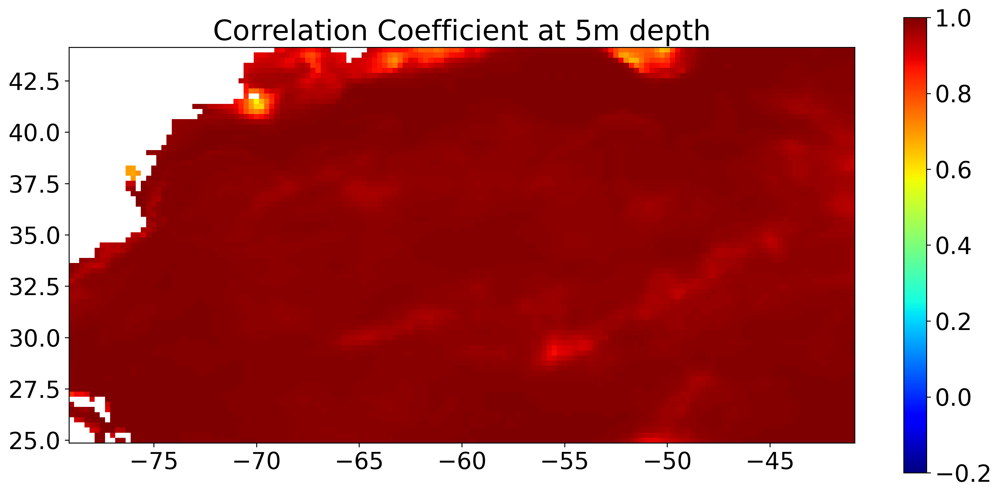

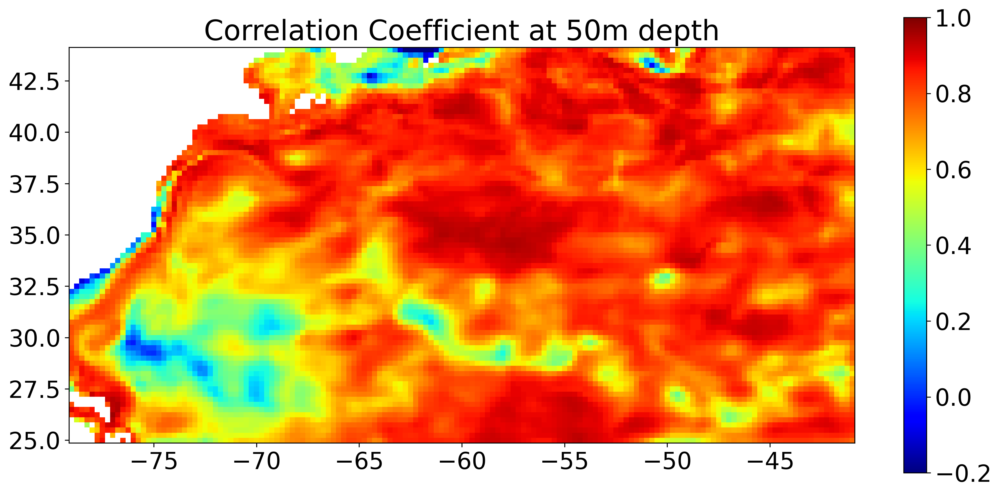

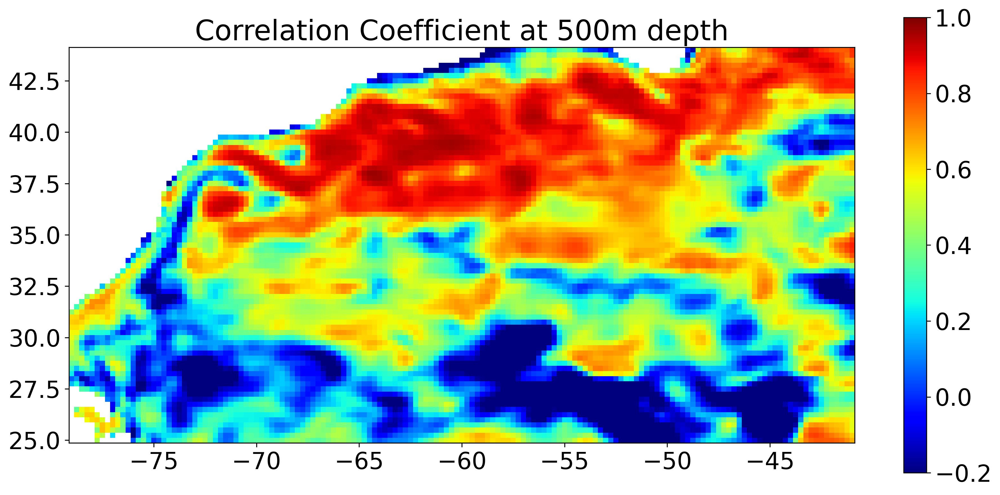

In [8]:
import numpy as np

def compute_correlation_map(matrix1, matrix2):
    # Get the dimensions
    A, B, C = matrix1.shape
    
    # Initialize correlation map
    correlation_map = np.zeros((B, C))
    
    for i in range(B):
        for j in range(C):
            # Extract time series from both matrices
            ts1 = matrix1[:, i, j]
            ts2 = matrix2[:, i, j]
            
            # Replace NaN values with 0
            ts1 = np.nan_to_num(ts1, nan=0)
            ts2 = np.nan_to_num(ts2, nan=0)
            
            # Compute correlation coefficient
            correlation_map[i, j] = np.corrcoef(ts1, ts2)[0, 1]
    
    return correlation_map
    
mm5 = np.stack(matrices_model_5_asal, axis=0)
mp5 = np.stack(matrices_pred_5_asal, axis=0)

correlation_coefficients_5 = compute_correlation_map(mm5, mp5)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Correlation Coefficient at 5m depth')
plt.imshow(correlation_coefficients_5, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_LSTM_512_S_5.png")
plt.show()

mm50 = np.stack(matrices_model_50_asal, axis=0)
mp50 = np.stack(matrices_pred_50_asal, axis=0)
correlation_coefficients_50 = compute_correlation_map(mm50, mp50)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Correlation Coefficient at 50m depth')
plt.imshow(correlation_coefficients_50, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_LSTM_512_S_50.png")
plt.show()

mm500 = np.stack(matrices_model_500_asal, axis=0)
mp500 = np.stack(matrices_pred_500_asal, axis=0)
correlation_coefficients_500 = compute_correlation_map(mm500, mp500)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Correlation Coefficient at 500m depth')
plt.imshow(correlation_coefficients_500, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_LSTM_512_S_500.png")

plt.show()

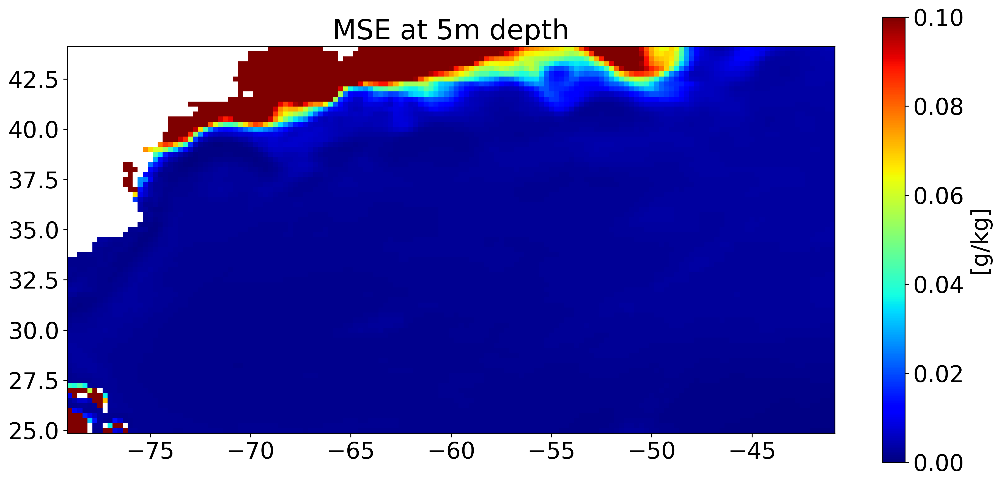

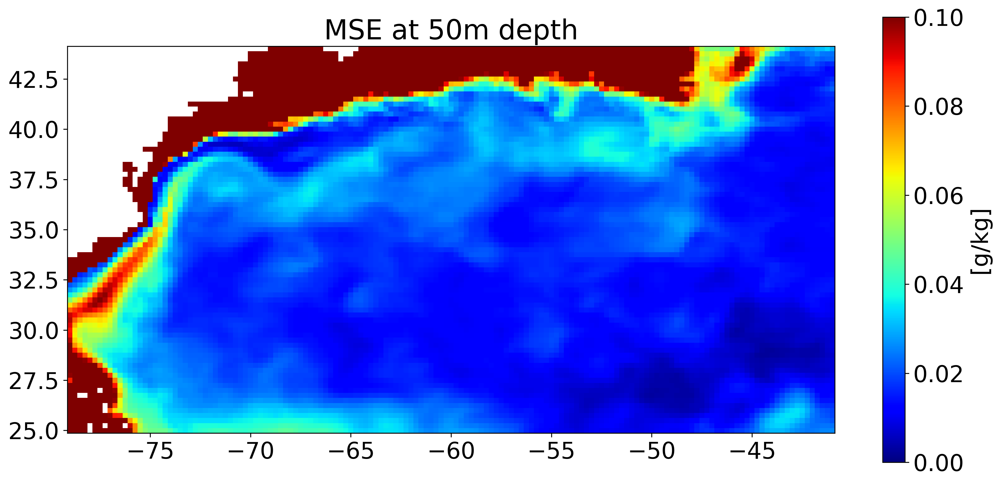

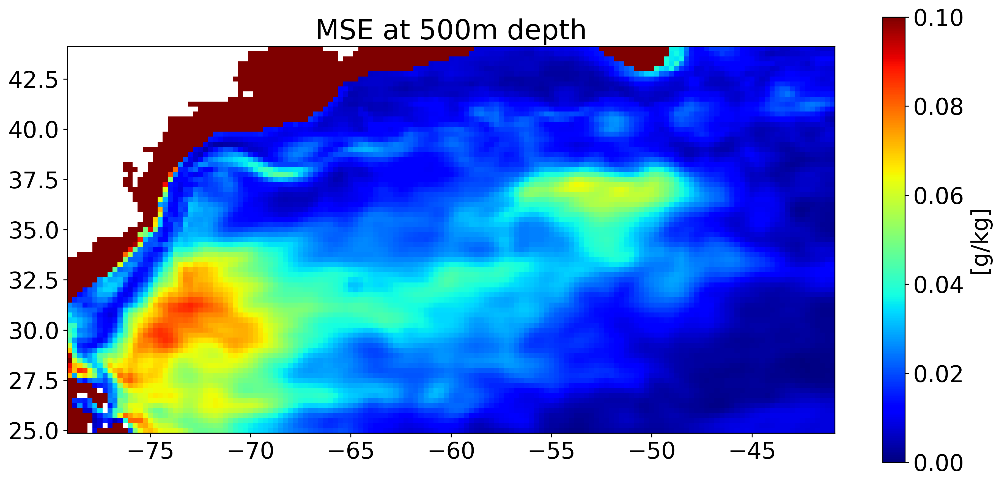

In [9]:
import numpy as np
import sklearn
from sklearn.metrics import mean_squared_error

def compute_MSE_map(matrix1, matrix2):
    # Get the dimensions
    A, B, C = matrix1.shape
    
    # Initialize correlation map
    correlation_map = np.zeros((B, C))
    
    for i in range(B):
        for j in range(C):
            # Extract time series from both matrices
            ts1 = matrix1[:, i, j]
            ts2 = matrix2[:, i, j]
            
            # Replace NaN values with 0
            ts1 = np.nan_to_num(ts1, nan=0)
            ts2 = np.nan_to_num(ts2, nan=0)
            
            # Compute correlation coefficient
            correlation_map[i, j] = sklearn.metrics.mean_squared_error(ts1, ts2)
            correlation_map[correlation_map==0] = np.nan

    return correlation_map
    
mm5 = np.stack(matrices_model_5_asal, axis=0)
mp5 = np.stack(matrices_pred_5_asal, axis=0)
mse_5 = compute_MSE_map(mm5, mp5)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('MSE at 5m depth')
plt.imshow(mse_5, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=0.1, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MSE_LSTM_512_S_5.png")
plt.show()

mm50 = np.stack(matrices_model_50_asal, axis=0)
mp50 = np.stack(matrices_pred_50_asal, axis=0)
mse_50 = compute_MSE_map(mm50, mp50)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('MSE at 50m depth')
plt.imshow(mse_50, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=0.1, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MSE_LSTM_512_S_50.png")
plt.show()

mm500 = np.stack(matrices_model_500_asal, axis=0)
mp500 = np.stack(matrices_pred_500_asal, axis=0)
mse_500 = compute_MSE_map(mm500, mp500)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('MSE at 500m depth')
plt.imshow(mse_500, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=0.1, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MSE_LSTM_512_S_500.png")
plt.show()

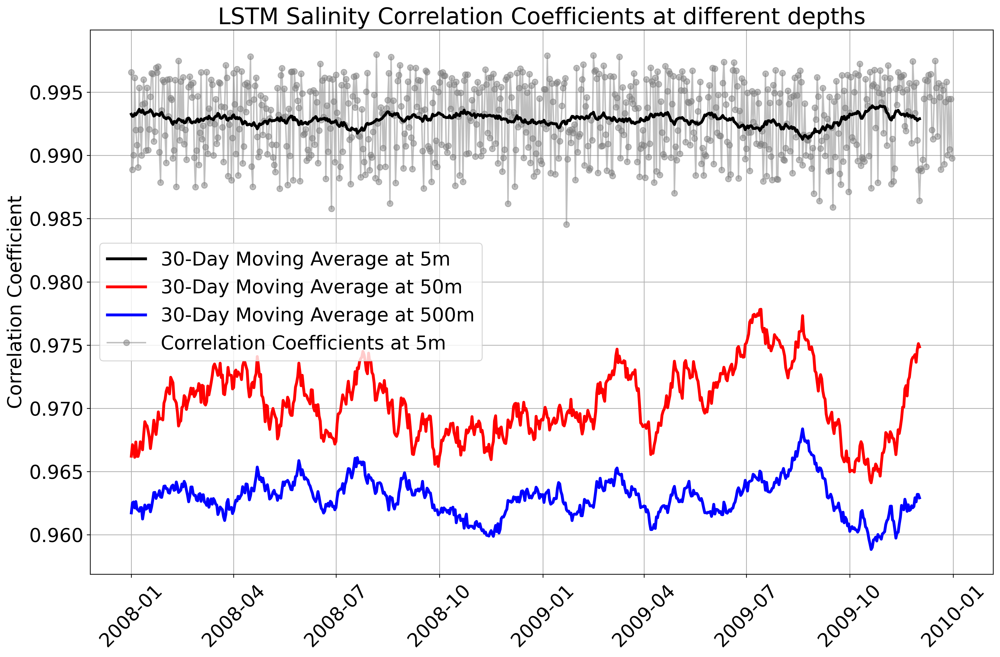

In [10]:
def calculate_correlation_time_series(matrix1, matrix2):
    A, B, C = matrix1.shape
    
    # Initialize correlation map
    corr_ts = np.zeros(A)
    
    for i in range(A):
        # Extract time series from both matrices
        im1 = matrix1[i, :, :]
        im2 = matrix2[i, :, :]
        
        # Flatten the images to 1D arrays
        image1_flat = im1.flatten()
        image2_flat = im2.flatten()
    
        # Create a mask to identify non-NaN positions in both images
        valid_mask = ~np.isnan(image1_flat) & ~np.isnan(image2_flat)
        
        # Filter out the NaN positions
        image1_filtered = image1_flat[valid_mask]
        image2_filtered = image2_flat[valid_mask]
        
        if len(image1_filtered) == 0 or len(image2_filtered) == 0:
            # If there are no valid data points, set correlation to NaN
            corr_ts[i] = np.nan
        else:
            # Calculate the Pearson correlation coefficient
            correlation_matrix = np.corrcoef(image1_filtered, image2_filtered)
            corr_ts[i] = correlation_matrix[0, 1]
    
    return corr_ts

import matplotlib.pyplot as plt
import pandas as pd

window_size = 30

mm5 = np.stack(matrices_model_5_asal, axis=0)
mp5 = np.stack(matrices_pred_5_asal, axis=0)
mm50 = np.stack(matrices_model_50_asal, axis=0)
mp50 = np.stack(matrices_pred_50_asal, axis=0)
mm500 = np.stack(matrices_model_500_asal, axis=0)
mp500 = np.stack(matrices_pred_500_asal, axis=0)

# Generate date range from 2008-01-01 to 2009-12-31
date_range = pd.date_range(start='2008-01-01', end='2009-12-31')

correlation_coefficients_ts_5 = calculate_correlation_time_series(mm5, mp5)  # Replace with your array of correlation coefficients
correlation_coefficients_ts_50 = calculate_correlation_time_series(mm50, mp50)  # Replace with your array of correlation coefficients
correlation_coefficients_ts_500 = calculate_correlation_time_series(mm500, mp500)  # Replace with your array of correlation coefficients


# Calculate the moving average
moving_average_5 = np.convolve(correlation_coefficients_ts_5, np.ones(window_size)/window_size, mode='valid')
moving_average_50 = np.convolve(correlation_coefficients_ts_50, np.ones(window_size)/window_size, mode='valid')
moving_average_500 = np.convolve(correlation_coefficients_ts_500, np.ones(window_size)/window_size, mode='valid')

# Plot the correlation coefficients over time
plt.figure(figsize=(15, 10), dpi=300)
plt.plot(date_range[:-window_size+1], moving_average_5, color='black', linewidth=3,  linestyle='-', label='30-Day Moving Average at 5m', zorder = 5)
plt.plot(date_range[:-window_size+1], moving_average_50, color='red', linewidth=3,  linestyle='-', label='30-Day Moving Average at 50m', zorder = 4)
plt.plot(date_range[:-window_size+1], moving_average_500, color='blue', linewidth=3,  linestyle='-', label='30-Day Moving Average at 500m', zorder = 3)
plt.plot(date_range, correlation_coefficients_ts_5, marker='o', linestyle='-', color='grey', label='Correlation Coefficients at 5m', alpha = 0.5)
plt.title('LSTM Salinity Correlation Coefficients at different depths')
plt.ylabel('Correlation Coefficient')
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.savefig("CORR_TS_LSTM_512_S.png")
# Show the plot
plt.show()

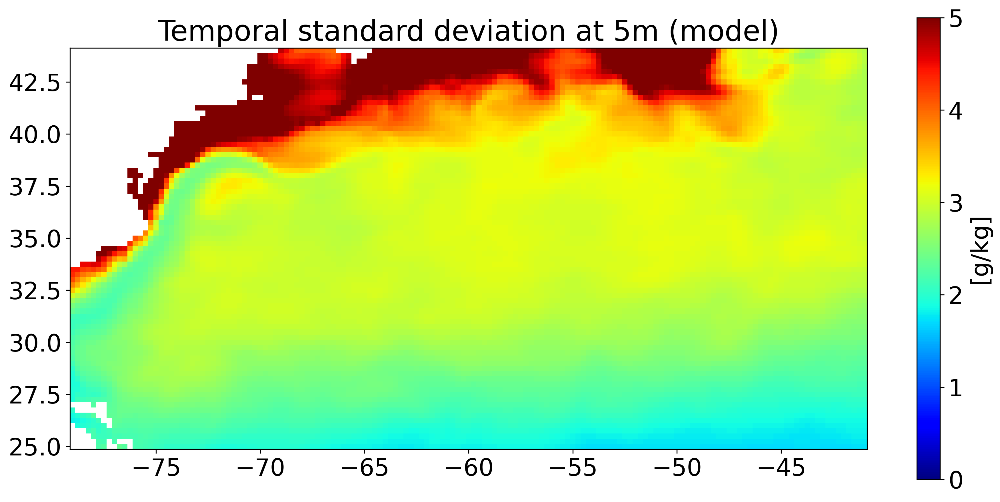

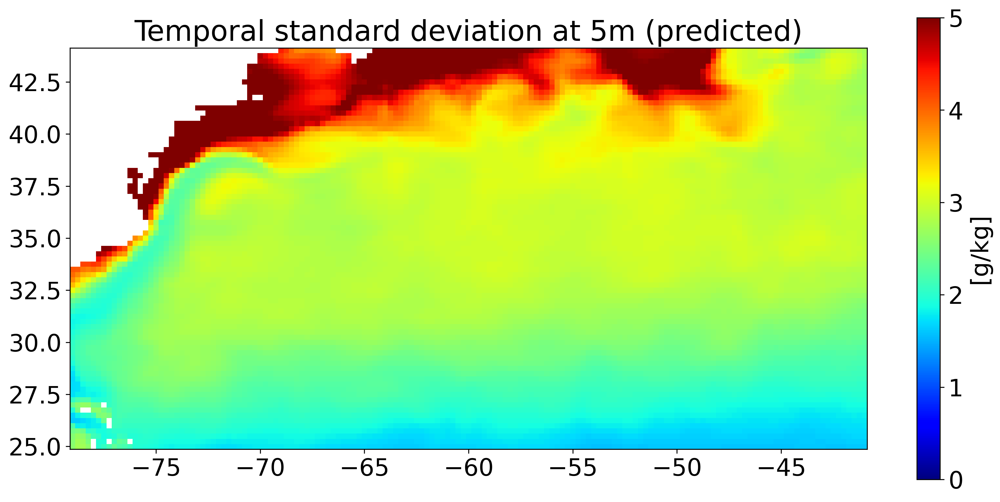

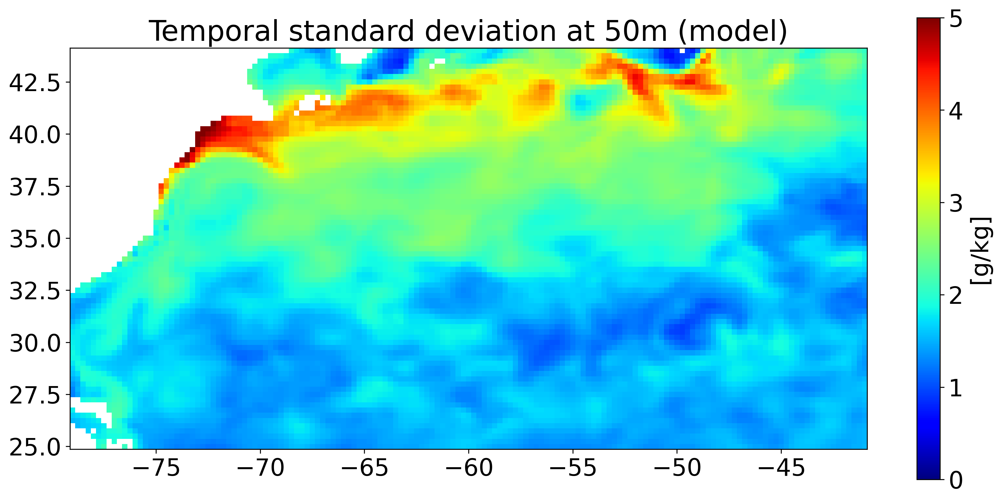

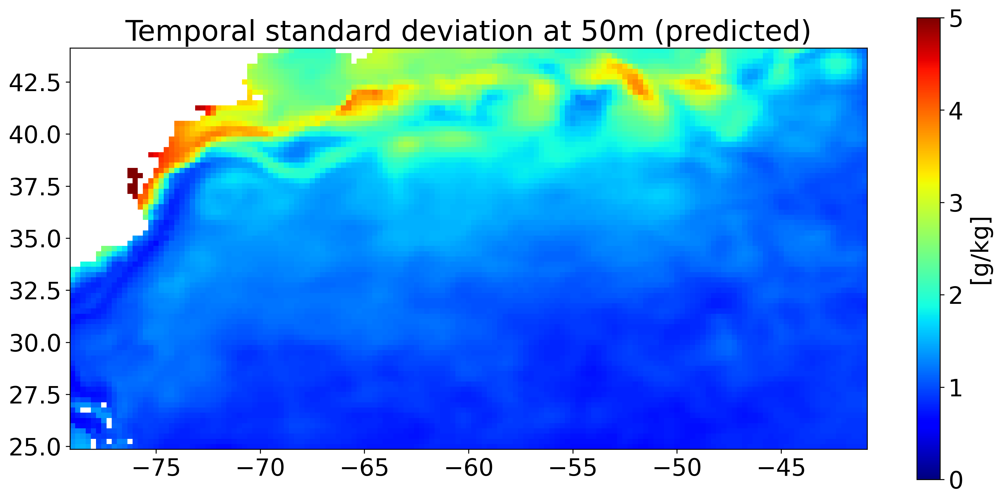

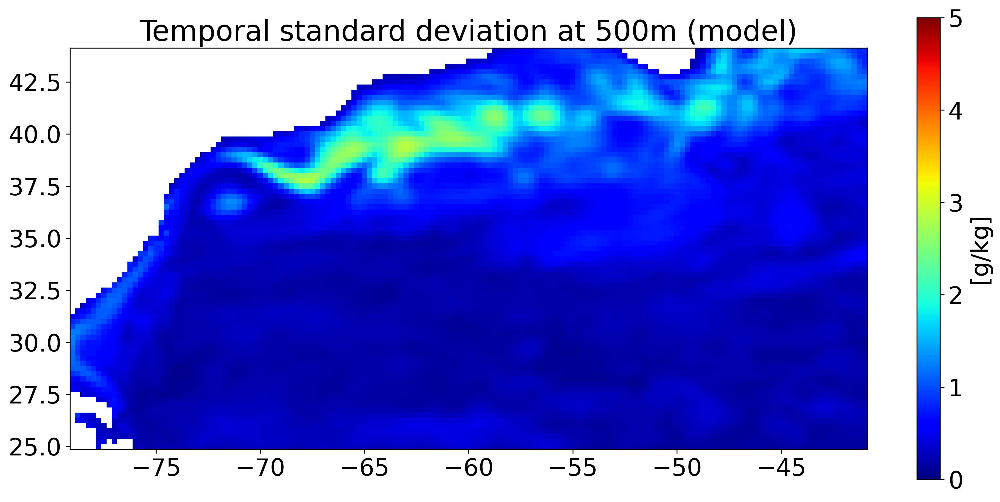

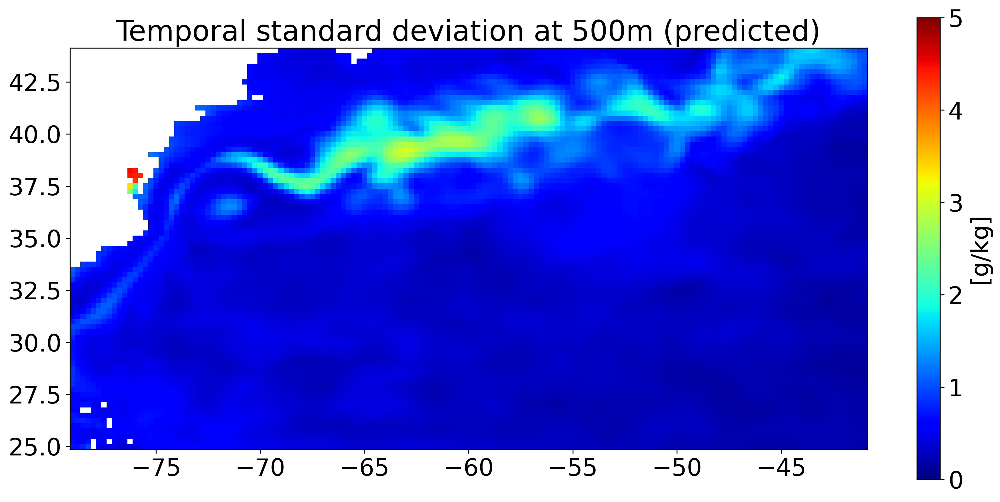

In [11]:
mm5 = np.stack(matrices_model_5_ctemp, axis=0)
mp5 = np.stack(matrices_pred_5_ctemp, axis=0)

std_ctemp_5_pred, std_ctemp_5_mod = compute_std_map(mp5, mm5)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 5m (model)')
plt.imshow(std_ctemp_5_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax = 5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_T_5_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 5m (predicted)')
plt.imshow(std_ctemp_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax =5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_T_5_PRED.png")
plt.show()

# 50m
mm50 = np.stack(matrices_model_50_ctemp, axis=0)
mp50 = np.stack(matrices_pred_50_ctemp, axis=0)

std_ctemp_50_pred, std_ctemp_50_mod  = compute_std_map(mp50, mm50)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 50m (model)')
plt.imshow(std_ctemp_50_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_T_50_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 50m (predicted)')
plt.imshow(std_ctemp_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_T_50_PRED.png")
plt.show()

#500m
mm500 = np.stack(matrices_model_500_ctemp, axis=0)
mp500 = np.stack(matrices_pred_500_ctemp, axis=0)

std_ctemp_500_pred, std_ctemp_500_mod  = compute_std_map(mp500, mm500)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 500m (model)')
plt.imshow(std_ctemp_500_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax= 5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_T_500_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal standard deviation at 500m (predicted)')
plt.imshow(std_ctemp_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=5, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("STD_LSTM_512_T_500_PRED.png")
plt.show()

(731, 77, 153)
(731, 77, 153)


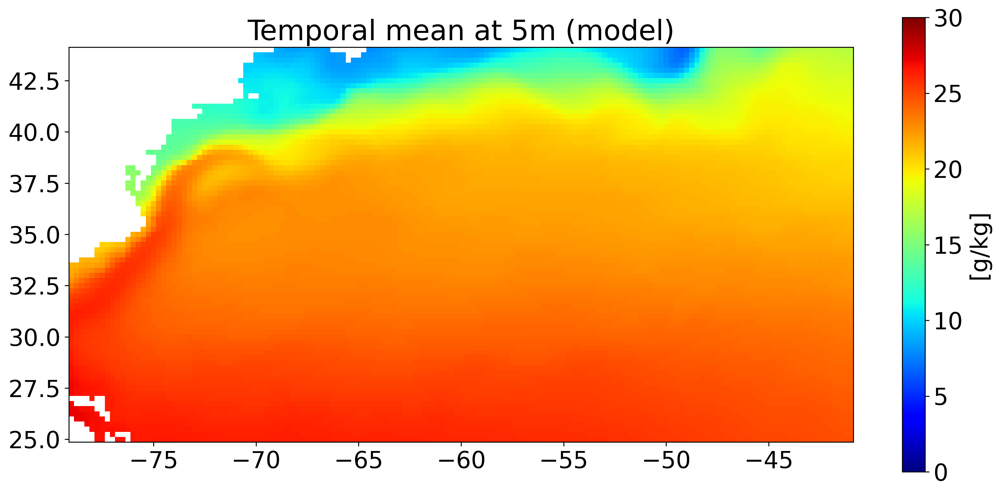

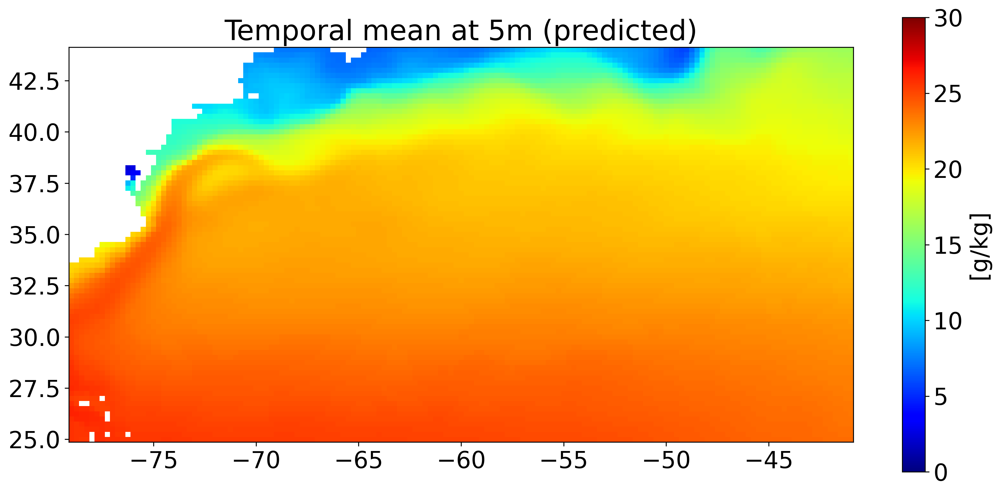

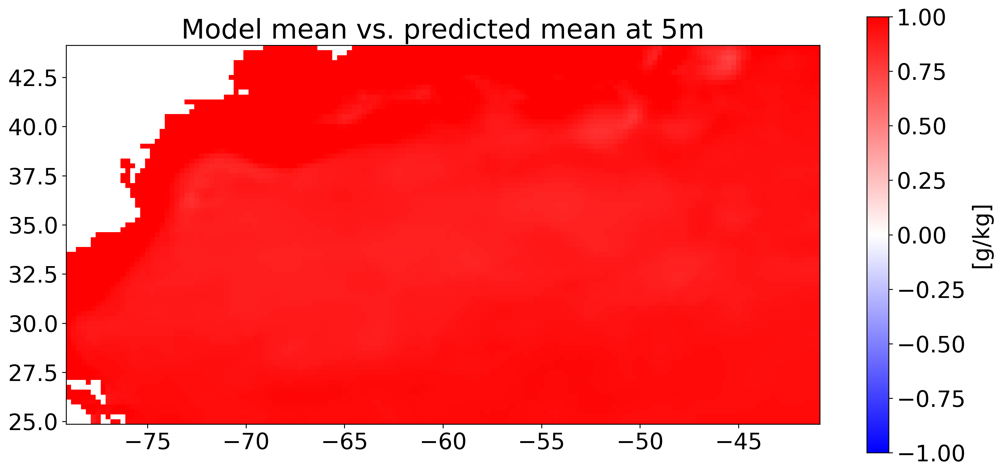

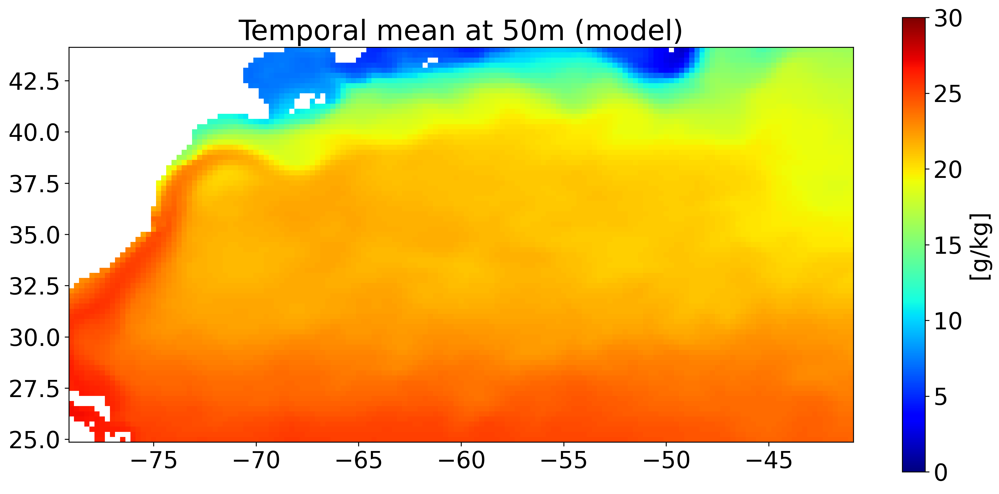

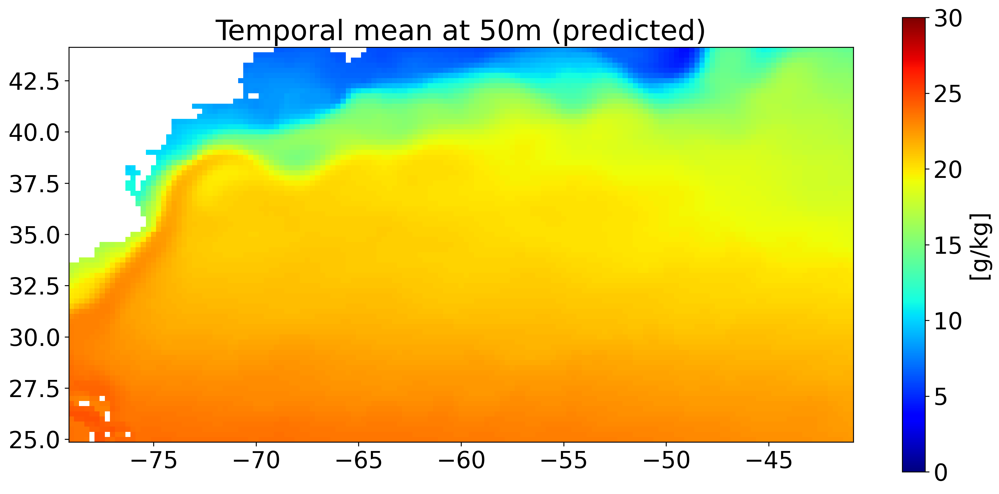

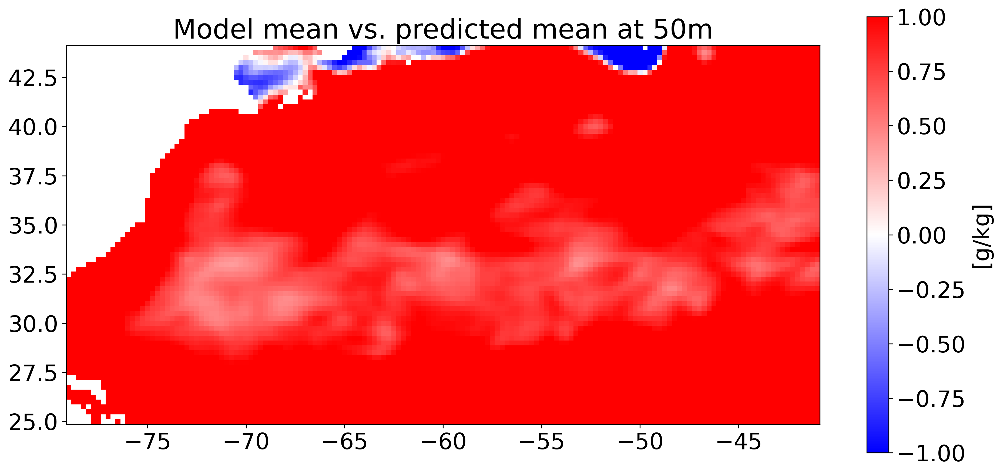

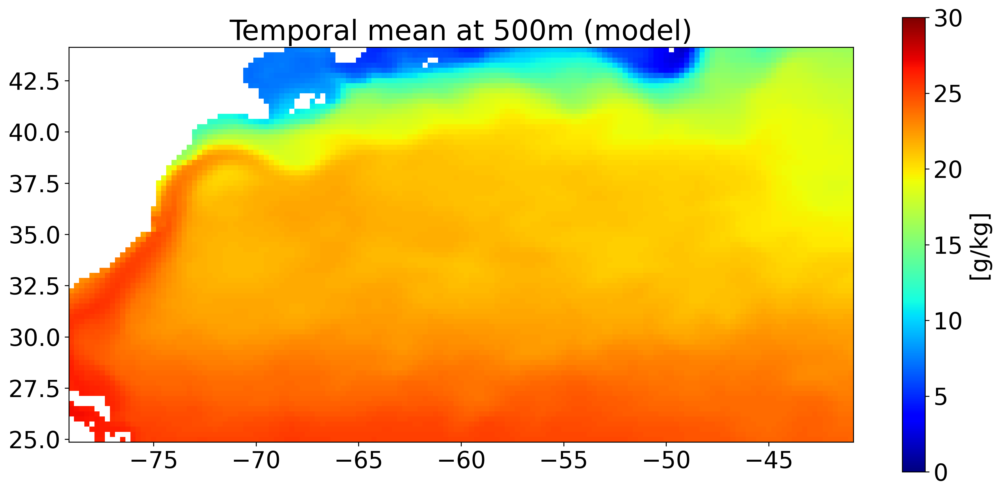

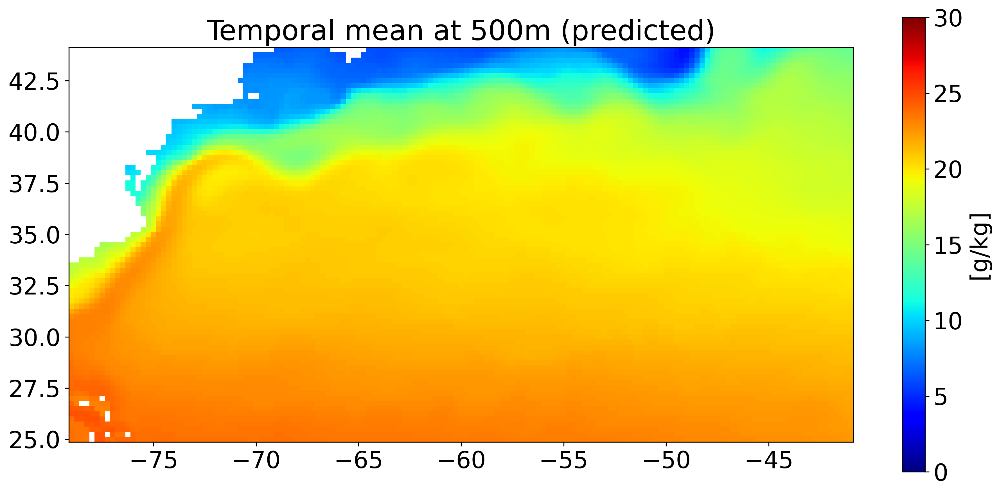

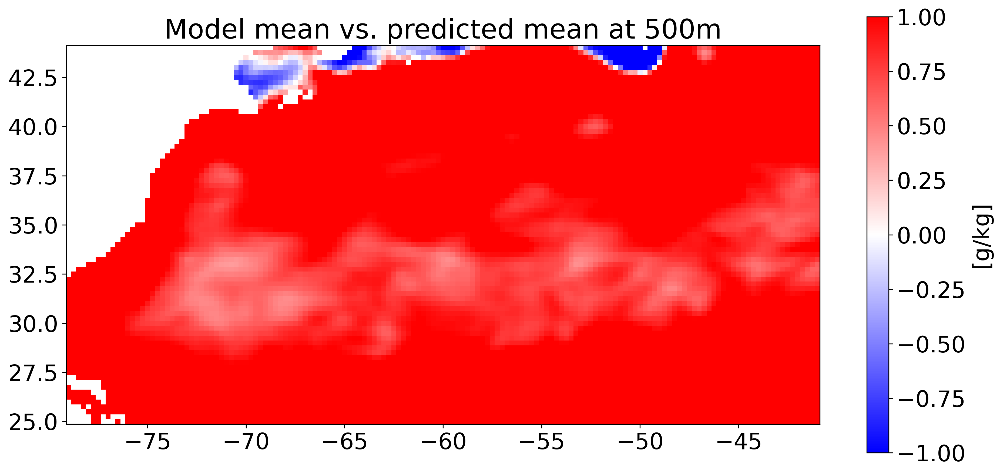

In [12]:
mm5 = np.stack(matrices_model_5_ctemp, axis=0)
mp5 = np.stack(matrices_pred_5_ctemp, axis=0)

print(np.shape(mm5))
print(np.shape(mp5))


mean_ctemp_5_pred, mean_ctemp_5_mod = compute_mean_map(mp5, mm5)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 5m (model)')
plt.imshow(mean_ctemp_5_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_T_5_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 5m (predicted)')
plt.imshow(mean_ctemp_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_T_5_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Model mean vs. predicted mean at 5m')
plt.imshow(mean_ctemp_5_mod - mean_ctemp_5_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("BIAS_LSTM_512_T_5_PRED.png")
plt.show()

# 50m
mm50 = np.stack(matrices_model_50_ctemp, axis=0)
mp50 = np.stack(matrices_pred_50_ctemp, axis=0)

mean_ctemp_50_pred, mean_ctemp_50_mod = compute_mean_map(mp50, mm50)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 50m (model)')
plt.imshow(mean_ctemp_50_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_T_50_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 50m (predicted)')
plt.imshow(mean_ctemp_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_T_50_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Model mean vs. predicted mean at 50m')
plt.imshow(mean_ctemp_50_mod - mean_ctemp_50_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("BIAS_LSTM_512_T_50_PRED.png")
plt.show()

#500m
mm500 = np.stack(matrices_model_500_ctemp, axis=0)
mp500 = np.stack(matrices_pred_500_ctemp, axis=0)

mean_ctemp_500_pred, mean_ctemp_500_mod = compute_mean_map(mp50, mm50)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 500m (model)')
plt.imshow(mean_ctemp_500_mod, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_T_500_MOD.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Temporal mean at 500m (predicted)')
plt.imshow(mean_ctemp_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=0, vmax=30, cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MEAN_LSTM_512_T_500_PRED.png")
plt.show()

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Model mean vs. predicted mean at 500m')
plt.imshow(mean_ctemp_500_mod - mean_ctemp_500_pred, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], origin='lower', vmin=-1, vmax=1, cmap = 'bwr')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("BIAS_LSTM_512_T_500_PRED.png")
plt.show()

/opt/conda/envs/TensorFlow/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/opt/conda/envs/TensorFlow/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


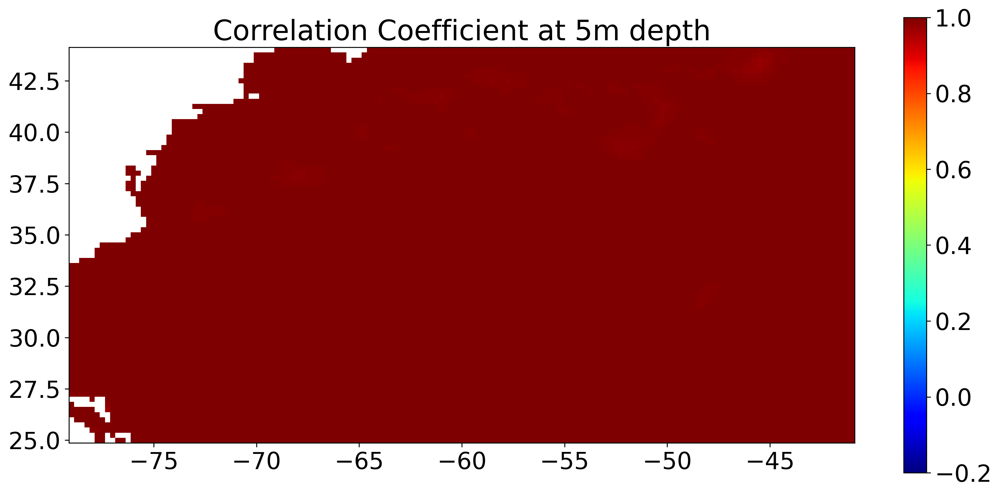

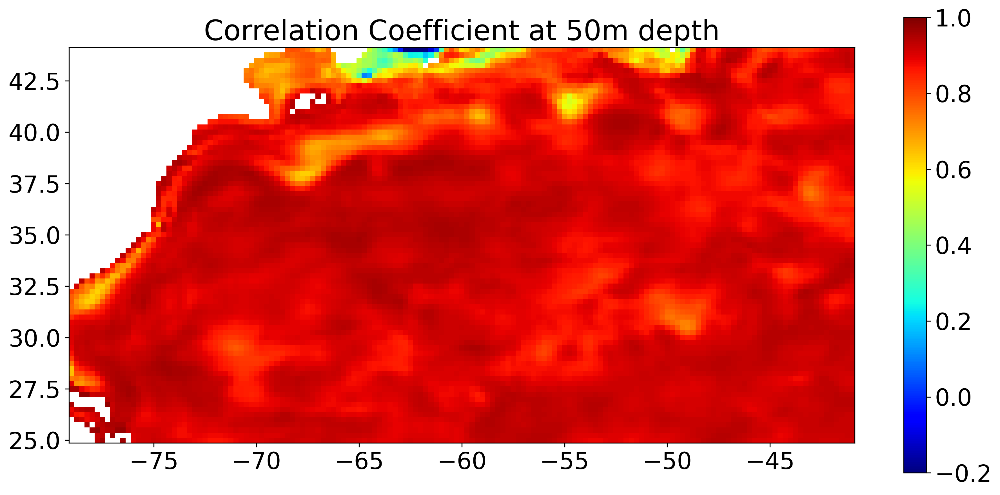

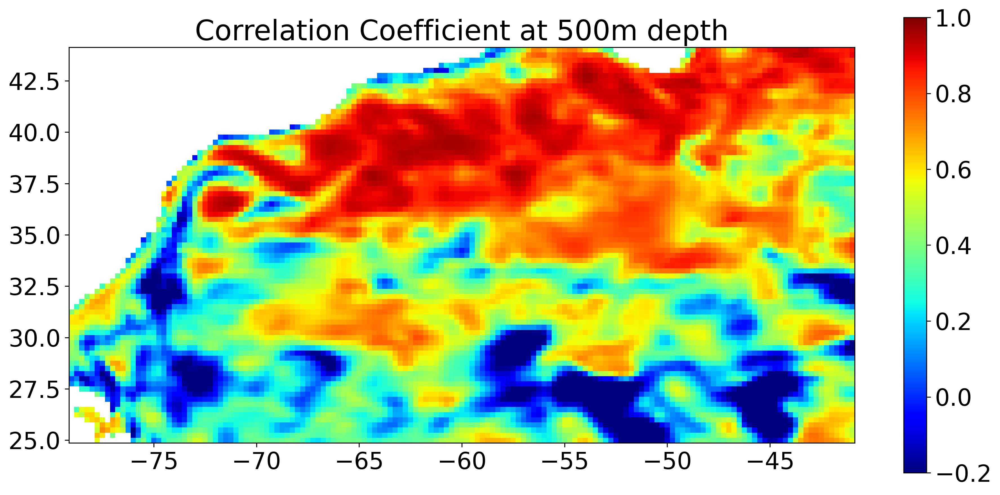

In [13]:

mm5 = np.stack(matrices_model_5_ctemp, axis=0)
mp5 = np.stack(matrices_pred_5_ctemp, axis=0)
correlation_coefficients_temp_5 = compute_correlation_map(mm5, mp5)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Correlation Coefficient at 5m depth')
plt.imshow(correlation_coefficients_temp_5, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_LSTM_512_T_5.png")
plt.show()

mm50 = np.stack(matrices_model_50_ctemp, axis=0)
mp50 = np.stack(matrices_pred_50_ctemp, axis=0)
correlation_coefficients_temp_50 = compute_correlation_map(mm50, mp50)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Correlation Coefficient at 50m depth')
plt.imshow(correlation_coefficients_temp_50, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_LSTM_512_T_50.png")
plt.show()

mm500 = np.stack(matrices_model_500_ctemp, axis=0)
mp500 = np.stack(matrices_pred_500_ctemp, axis=0)
correlation_coefficients_temp_500 = compute_correlation_map(mm500, mp500)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('Correlation Coefficient at 500m depth')
plt.imshow(correlation_coefficients_temp_500, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=-0.2, vmax=1, origin='lower', cmap = 'jet')
plt.colorbar()
plt.savefig("CORR_LSTM_512_T_500.png")

plt.show()

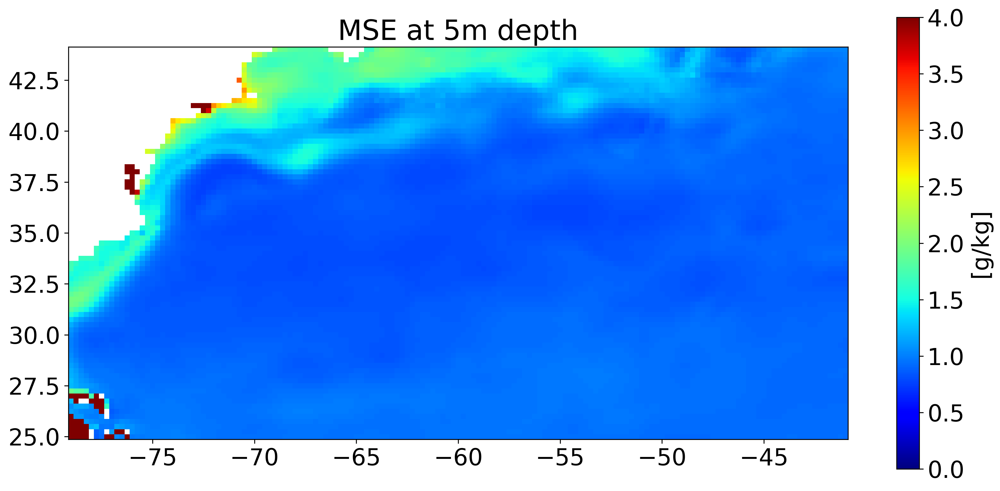

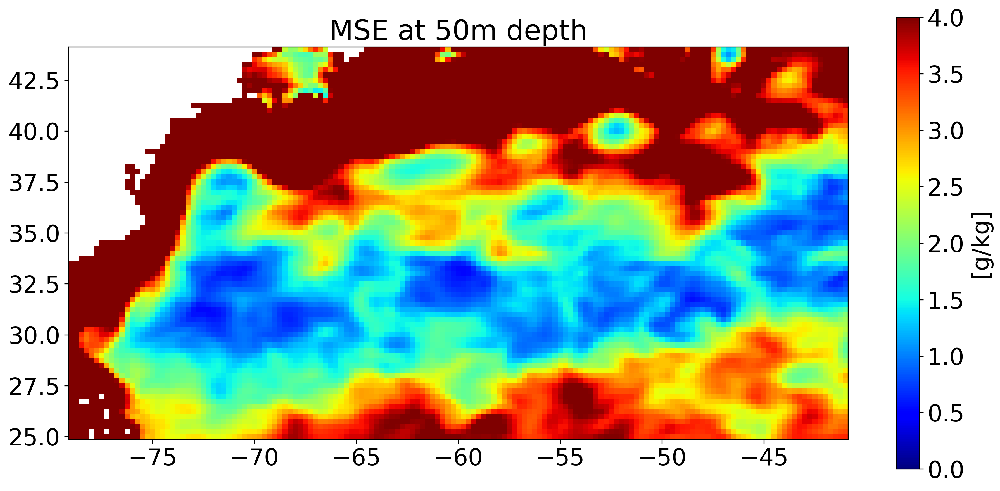

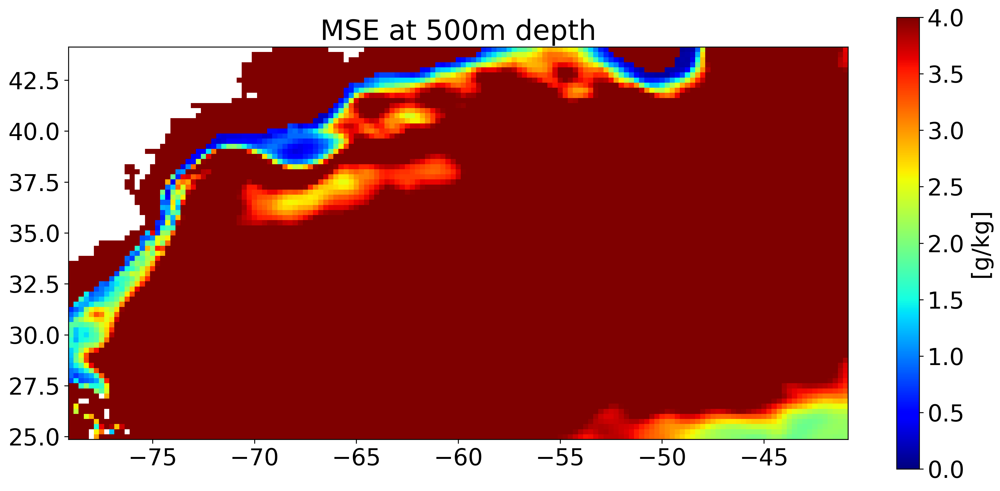

In [14]:
mm5 = np.stack(matrices_model_5_ctemp, axis=0)
mp5 = np.stack(matrices_pred_5_ctemp, axis=0)
mse_temp_5 = compute_MSE_map(mm5, mp5)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('MSE at 5m depth')
plt.imshow(mse_temp_5, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=4, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MSE_LSTM_512_T_5.png")
plt.show()

mm50 = np.stack(matrices_model_50_ctemp, axis=0)
mp50 = np.stack(matrices_pred_50_ctemp, axis=0)
mse_temp_50 = compute_MSE_map(mm50, mp50)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('MSE at 50m depth')
plt.imshow(mse_temp_50, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=4, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MSE_LSTM_512_T_50.png")
plt.show()

mm500 = np.stack(matrices_model_500_ctemp, axis=0)
mp500 = np.stack(matrices_pred_500_ctemp, axis=0)
mse_temp_500 = compute_MSE_map(mm500, mp500)

plt.figure(figsize=((15,7)), dpi=300)
# Visualize the standard deviation matrix
plt.title('MSE at 500m depth')
plt.imshow(mse_temp_500, extent=[lon_bins[0], lon_bins[-1], lat_bins[0], lat_bins[-1]], vmin=0, vmax=4, origin='lower', cmap = 'jet')
cbar = plt.colorbar()
cbar.set_label('[g/kg]')  # Add your label here
plt.savefig("MSE_LSTM_512_T_500.png")
plt.show()

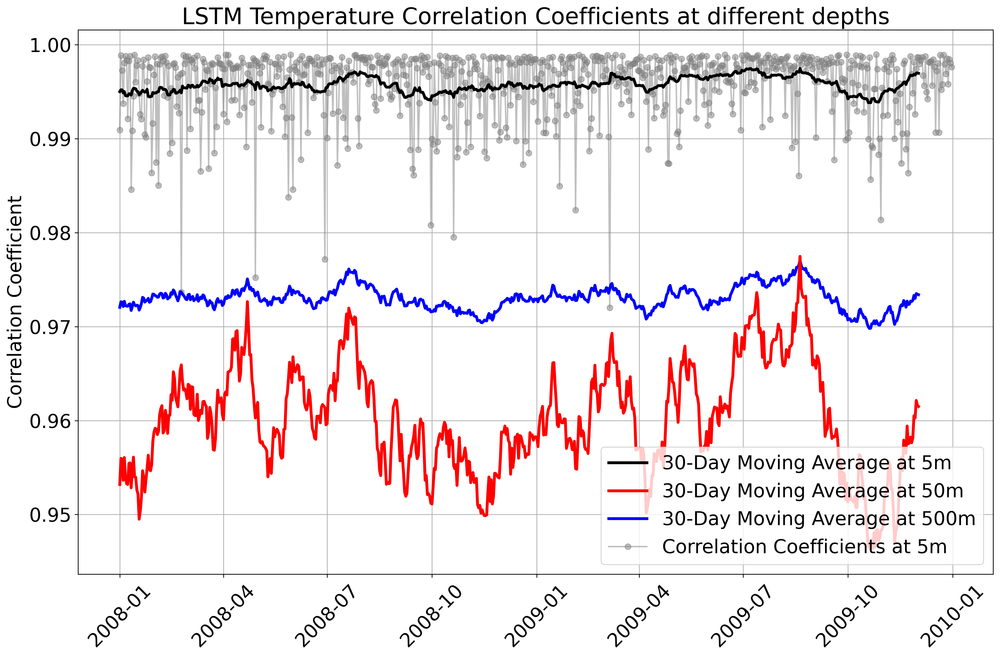

In [15]:
window_size = 30

mm5 = np.stack(matrices_model_5_ctemp, axis=0)
mp5 = np.stack(matrices_pred_5_ctemp, axis=0)
mm50 = np.stack(matrices_model_50_ctemp, axis=0)
mp50 = np.stack(matrices_pred_50_ctemp, axis=0)
mm500 = np.stack(matrices_model_500_ctemp, axis=0)
mp500 = np.stack(matrices_pred_500_ctemp, axis=0)

# Generate date range from 2008-01-01 to 2009-12-31
date_range = pd.date_range(start='2008-01-01', end='2009-12-31')

correlation_coefficients_ts_5 = calculate_correlation_time_series(mm5, mp5)  # Replace with your array of correlation coefficients
correlation_coefficients_ts_50 = calculate_correlation_time_series(mm50, mp50)  # Replace with your array of correlation coefficients
correlation_coefficients_ts_500 = calculate_correlation_time_series(mm500, mp500)  # Replace with your array of correlation coefficients


# Calculate the moving average
moving_average_temp_5 = np.convolve(correlation_coefficients_ts_5, np.ones(window_size)/window_size, mode='valid')
moving_average_temp_50 = np.convolve(correlation_coefficients_ts_50, np.ones(window_size)/window_size, mode='valid')
moving_average_temp_500 = np.convolve(correlation_coefficients_ts_500, np.ones(window_size)/window_size, mode='valid')

# Plot the correlation coefficients over time
plt.figure(figsize=(15, 10), dpi=300)
plt.plot(date_range[:-window_size+1], moving_average_temp_5, color='black', linewidth=3,  linestyle='-', label='30-Day Moving Average at 5m', zorder = 5)
plt.plot(date_range[:-window_size+1], moving_average_temp_50, color='red', linewidth=3,  linestyle='-', label='30-Day Moving Average at 50m', zorder = 4)
plt.plot(date_range[:-window_size+1], moving_average_temp_500, color='blue', linewidth=3,  linestyle='-', label='30-Day Moving Average at 500m', zorder = 3)
plt.plot(date_range, correlation_coefficients_ts_5, marker='o', linestyle='-', color='grey', label='Correlation Coefficients at 5m', alpha = 0.5)
plt.title('LSTM Temperature Correlation Coefficients at different depths')
plt.ylabel('Correlation Coefficient')
plt.grid(True)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.savefig("CORR_TS_LSTM_512_T.png")
# Show the plot
plt.show()